#**I. Mount drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/CS114/Dung/Train6_newdata

/content/drive/.shortcut-targets-by-id/1ar57-yjgthRYEyLux_DeH_CoOeuRRcmb/CS114/Dung/Train6_newdata


#**II. Install Detectron2** 

In [ ]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
# install detectron2 that matches pytorch 1.8
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

     |████████████████████████████████| 274 kB 8.0 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=372b4db8991bbc1ca1ac02ee2859bc5a234f707af58ea245022f88c9e8ef91aa
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5 MB 15 kB/s 
     |████████████████████████████████| 17.3 MB 292 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successf

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.3 MB 8.2 MB/s 
     |████████████████████████████████| 49 kB 4.1 MB/s 
     |████████████████████████████████| 74 kB 3.7 MB/s 
     |████████████████████████████████| 130 kB 40.6 MB/s 
     |████████████████████████████████| 144 kB 39.2 MB/s 
     |████████████████████████████████| 722 kB 56.5 MB/s 
     |████████████████████████████████| 743 kB 45.6 MB/s 
     |████████████████████████████████| 112 kB 51.9 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20210804-py3-none-any.whl size=60618 sha256=4798b9c9054846344ae182bf261777fcfcac4e2c897985532b2a9acfdffef40c
  Stored in directory: /root/.cache/pip/wheels/1d/e2/fe/67887e71552be741faccead8f7a8e013b6e0b1225cf591afa1
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141229 sha256=071899bc35cc42b8db9bbdca6462885411b6107e472c9c2a32a1cd505ad045

In [ ]:
exit(0)

#**III. Import**

In [ ]:
%cd /content/drive/MyDrive/CS114/Dung/Train6_newdata

/content/drive/.shortcut-targets-by-id/1ar57-yjgthRYEyLux_DeH_CoOeuRRcmb/CS114/Dung/Train6_newdata


In [ ]:
# Kiểm tra cài đặt pytorch, nếu lỗi chạy lại từ đầu 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   

1.8.0+cu101 True


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import numpy as np
import os, json, cv2, random, glob
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.config import config as cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.structures import BoxMode

#**III. Convert Data: Yolo txt To Coco json**

##**1. Download and unzip data**

In [ ]:
%cd /content/drive/MyDrive/CS114/data_update

In [ ]:
!gdown --id 1bZsQIdG3L6Puf_zOeKFblBF0UqoAs61j
!gdown --id 1-1oh6kiUwnRtHmVMGBgkvYyK1p1EBX7Z
!unzip data_final.zip
!unzip data_test.zip

##**2. Convert function**

In [ ]:

def get_data_dicts(label_dir, image_dir):
    anno_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]
    classes = ["0"]
    dataset_dicts = []
    count = 0

    for image_id, file_name in enumerate(anno_files):
        record = {}
        print(file_name)
        try:
            image_path = os.path.join(image_dir, file_name.rstrip('txt') + 'jpg')
            print("access {} file".format(image_path))
            height, width = cv2.imread(image_path).shape[:2]
            count += 1
            record["file_name"] = image_path
            record["image_id"] = image_id 
            record["height"] = height
            record["width"] = width

            annotations = open(os.path.join(label_dir, file_name), 'r')
            objs = []
            for line in annotations:
                line = line.rstrip('\n')
                class_id, x_center, y_center, w, h = line.split()[:]
            
                w = float(w)
                h = float(h)
                w = int(w * width)
                h = int(h * height)

                x_center = float(x_center)
                y_center = float(y_center)

                x_center = int(x_center * width)
                y_center = int(y_center * height)
                x_min = int(x_center - w/2)
                y_min = int(y_center - h/2)
                x_max = int(x_center + w/2)
                y_max = int(y_center + h/2)
                obj = {
                    'bbox' : [x_min, y_min, x_max, y_max],
                    'bbox_mode' : BoxMode.XYXY_ABS,
                    'category_id' : int(class_id),
                    'iscrowd' : 0
                }
                objs.append(obj)
            record["annotations"] = objs
            dataset_dicts.append(record)
        except:
            print('can not read file')
            pass
    
    return dataset_dicts

##**3. Create train_dicts.json**

In [ ]:
# Convert data
train_dicts = get_data_dicts('/content/drive/MyDrive/CS114/data_update/data_final/','/content/drive/MyDrive/CS114/data_update/data_final/')

In [ ]:
%cd /content/drive/MyDrive/CS114/Dung

/content/drive/.shortcut-targets-by-id/1ar57-yjgthRYEyLux_DeH_CoOeuRRcmb/CS114/Dung


In [ ]:
# Ghi vào file
with open('train_dicts_new.json', 'w') as fp:
     json.dump(train_dicts, fp)

In [ ]:
# Lấy dữ liệu từ file
with open('/content/drive/MyDrive/CS114/Dung/train_dicts_new.json') as fp:
    train_dicts = json.load(fp)

In [ ]:
for i in range(len(train_dicts)):
    for j in range(len(train_dicts[i]["annotations"])):
        train_dicts[i]["annotations"][j]['bbox_mode'] = BoxMode.XYXY_ABS

##**4. Create val_dicts.json**

In [ ]:
# Convert data
val_dicts = get_data_dicts('/content/drive/MyDrive/CS114/data_update/data_test/','/content/drive/MyDrive/CS114/data_update/data_test')

In [ ]:
%cd /content/drive/MyDrive/CS114/Dung 

/content/drive/.shortcut-targets-by-id/1ar57-yjgthRYEyLux_DeH_CoOeuRRcmb/CS114/Dung


In [ ]:
# Ghi file
with open('val_dicts_new.json', 'w') as fp:
     json.dump(val_dicts, fp)

In [ ]:
# Đọc file
with open('/content/drive/MyDrive/CS114/Dung/val_dicts_new.json') as fp:
    val_dicts = json.load(fp)

In [ ]:
for i in range(len(val_dicts)):
    for j in range(len(val_dicts[i]["annotations"])):
        val_dicts[i]["annotations"][j]['bbox_mode'] = BoxMode.XYXY_ABS

##**5. Metadata**

In [ ]:
# Metadata
classes = ['No entry','No parking / waiting','No turning','Max speed','Other prohibition signs','Warning','Mandatory','Indication','Other sign']

data = [train_dicts, val_dicts]

for index, d in enumerate(["train", "val"]):
    DatasetCatalog.register("signs_data/" + d, lambda index=index: data[index])
    MetadataCatalog.get("signs_data/" + d).set(thing_classes = classes)

traffic_sign_metadata = MetadataCatalog.get("signs_data/train")

 # **IV. Visualize**

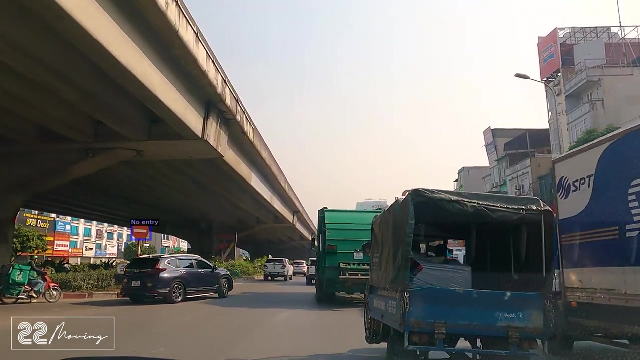

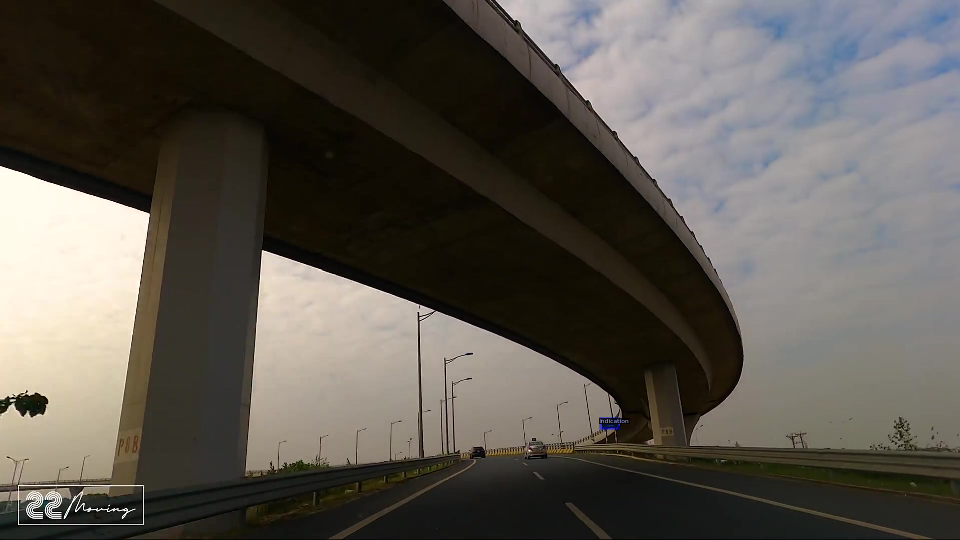

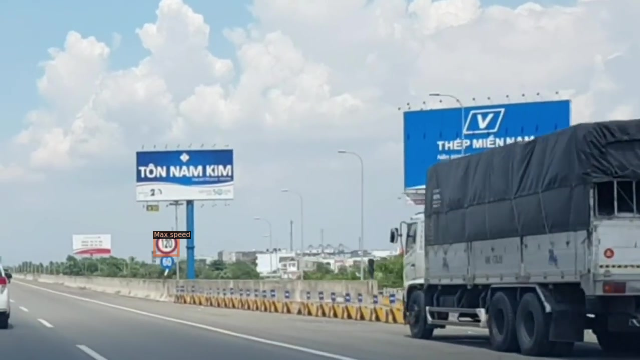

In [ ]:
# Hiển thị 3 hình ảnh và bounding box tương ứng của nó
for d in random.sample(train_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=traffic_sign_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

#**V. Train**

In [ ]:
%cd /content/drive/MyDrive/CS114/Dung/Train6_newdata

/content/drive/.shortcut-targets-by-id/1ar57-yjgthRYEyLux_DeH_CoOeuRRcmb/CS114/Dung/Train6_newdata


In [ ]:
# Setup config

from detectron2.engine import DefaultTrainer
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("signs_data/train",)
cfg.DATASETS.TEST = ("signs_data/val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml") 
#cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/CS114/Dung/Train5_newdata/output/model_final.pth'
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0001  # pick a good LR
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 35000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []       # do not decay learning rate
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.RETINANET.BATCH_SIZE_PER_IMAGE = 64  
cfg.MODEL.RETINANET.NUM_CLASSES = 9 
cfg.TEST.EVAL_PERIOD = 500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Train
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[08/06 02:20:14 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
model_final_5bd44e.pkl: 152MB [00:04, 35.3MB/s]                           
Skip loading parameter 'head.cls_score.weight' to the model due to incompatible shapes: (720, 256, 3, 3) in the checkpoint but (81, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'head.cls_score.bias' to the model due to incompatible shapes: (720,) in the checkpoint but (81,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
head.cl

[08/06 02:20:21 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[08/06 02:20:40 d2.utils.events]:  eta: 8:47:10  iter: 19  total_loss: 1.269  loss_cls: 1.011  loss_box_reg: 0.2729  time: 0.8969  data_time: 0.0419  lr: 1.9981e-06  max_mem: 2303M
[08/06 02:20:47 d2.utils.events]:  eta: 7:41:35  iter: 39  total_loss: 1.287  loss_cls: 1.131  loss_box_reg: 0.2237  time: 0.6125  data_time: 0.0079  lr: 3.9961e-06  max_mem: 2303M
[08/06 02:20:53 d2.utils.events]:  eta: 3:04:31  iter: 59  total_loss: 1.329  loss_cls: 1.039  loss_box_reg: 0.2674  time: 0.5069  data_time: 0.0089  lr: 5.9941e-06  max_mem: 2303M
[08/06 02:20:59 d2.utils.events]:  eta: 3:03:30  iter: 79  total_loss: 1.475  loss_cls: 1.185  loss_box_reg: 0.2559  time: 0.4544  data_time: 0.0091  lr: 7.9921e-06  max_mem: 2303M
[08/06 02:21:05 d2.utils.events]:  eta: 3:03:18  iter: 99  total_loss: 1.218  loss_cls: 0.901  loss_box_reg: 0.2528  time: 0.4242  data_time: 0.0091  lr: 9.9901e-06  max_mem: 2303M
[08/06 02:21:11 d2.utils.events]:  eta: 3:02:50  iter: 119  total_loss: 1.068  loss_cls: 0.8751

#**VI. Evaluation**

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("signs_data/val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "signs_data/val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [08/06 05:16:44 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[08/06 05:16:44 d2.evaluation.coco_evaluation]: 'signs_data/val' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[08/06 05:16:44 d2.data.datasets.coco]: Converting annotations of dataset 'signs_data/val' to COCO format ...)
[08/06 05:16:44 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[08/06 05:16:45 d2.data.datasets.coco]: Conversion finished, #images: 1070, #annotations: 2038
[08/06 05:16:45 d2.data.datasets.coco]: Caching COCO format annotations at './output/signs_data/val_coco_format.json' ...
[08/06 05:16:45 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/06 05:16:45 d2.data.common]: Serializing 1070 elements to byte tensors and

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[08/06 05:17:37 d2.evaluation.evaluator]: Inference done 11/1070. Dataloading: 0.0315 s/iter. Inference: 0.0666 s/iter. Eval: 0.0002 s/iter. Total: 0.0983 s/iter. ETA=0:01:44
[08/06 05:17:43 d2.evaluation.evaluator]: Inference done 69/1070. Dataloading: 0.0203 s/iter. Inference: 0.0675 s/iter. Eval: 0.0003 s/iter. Total: 0.0882 s/iter. ETA=0:01:28
[08/06 05:17:48 d2.evaluation.evaluator]: Inference done 114/1070. Dataloading: 0.0296 s/iter. Inference: 0.0677 s/iter. Eval: 0.0004 s/iter. Total: 0.0978 s/iter. ETA=0:01:33
[08/06 05:17:53 d2.evaluation.evaluator]: Inference done 158/1070. Dataloading: 0.0355 s/iter. Inference: 0.0677 s/iter. Eval: 0.0004 s/iter. Total: 0.1037 s/iter. ETA=0:01:34
[08/06 05:17:58 d2.evaluation.evaluator]: Inference done 202/1070. Dataloading: 0.0380 s/iter. Inference: 0.0677 s/iter. Eval: 0.0004 s/iter. Total: 0.1062 s/iter. ETA=0:01:32
[08/06 05:18:03 d2.evaluation.evaluator]: Inference done 253/1070. Dataloading: 0.0366 s/iter. Inference: 0.0676 s/iter. E

OrderedDict([('bbox',
              {'AP': 67.44261785416789,
               'AP-Indication': 71.14074894526784,
               'AP-Mandatory': 68.27089826130998,
               'AP-Max speed': 69.72896078991629,
               'AP-No entry': 65.87154672993617,
               'AP-No parking / waiting': 72.52379085786235,
               'AP-No turning': 73.45284833045557,
               'AP-Other prohibition signs': 69.22090556815378,
               'AP-Other sign': 57.54426094522993,
               'AP-Warning': 59.229600259379154,
               'AP50': 90.01722914210079,
               'AP75': 81.11399046016963,
               'APl': 87.27592793195375,
               'APm': 75.15586245496222,
               'APs': 41.568239950628474})])

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

#**VII. Predict Image**

In [ ]:
%cd /content/drive/MyDrive/CS114/Dung/Train6_newdata

/content/drive/.shortcut-targets-by-id/1ar57-yjgthRYEyLux_DeH_CoOeuRRcmb/CS114/Dung/Train6_newdata


In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

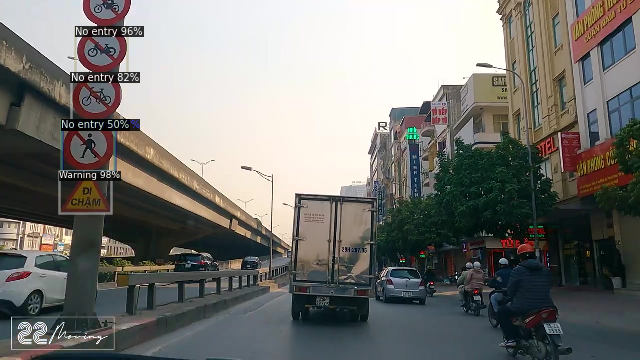

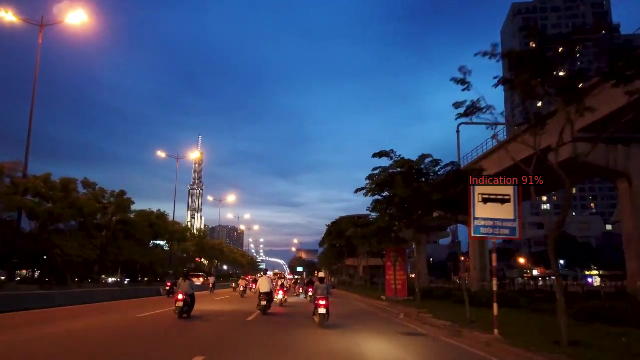

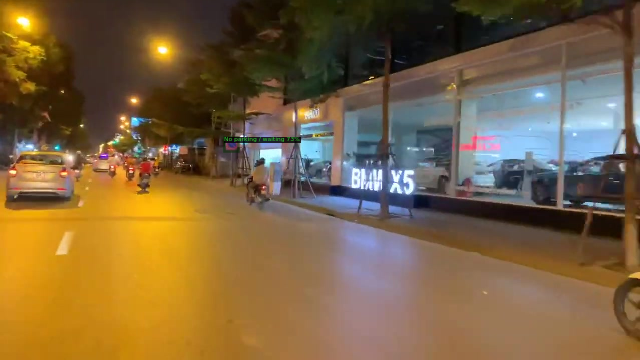

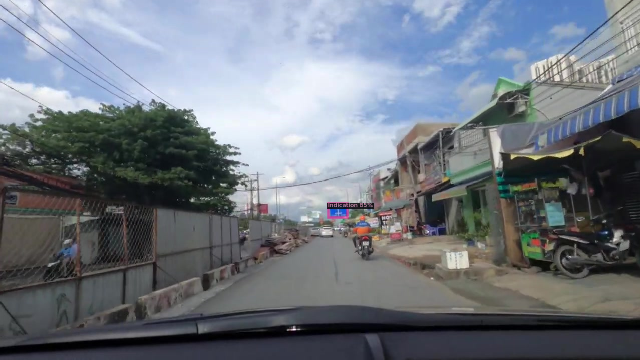

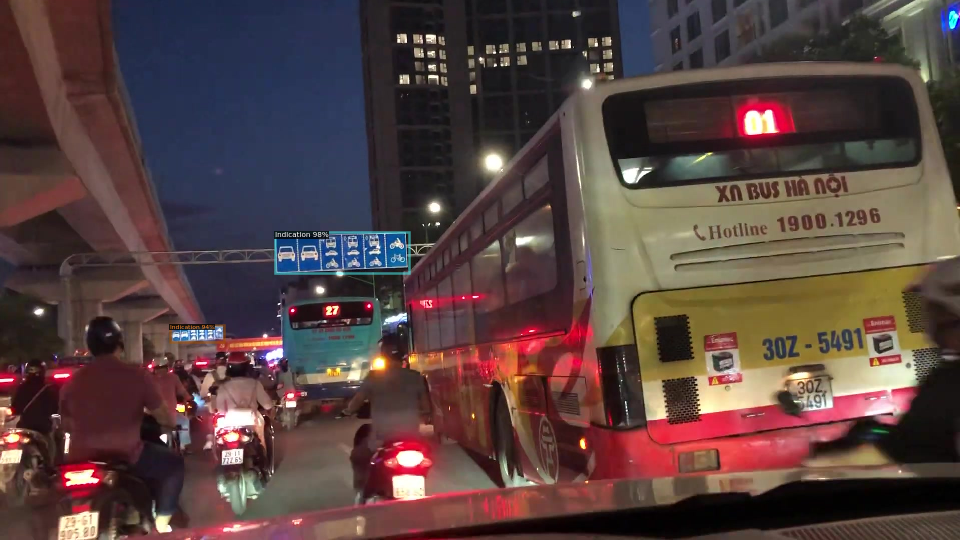

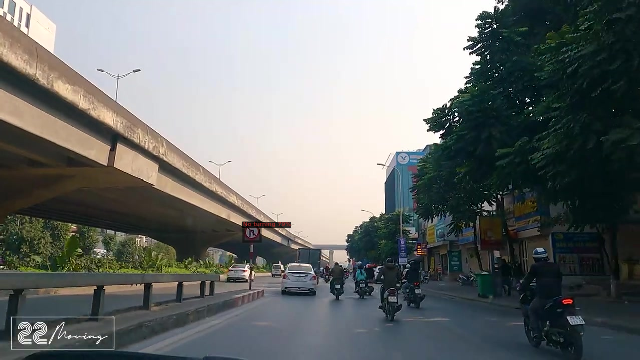

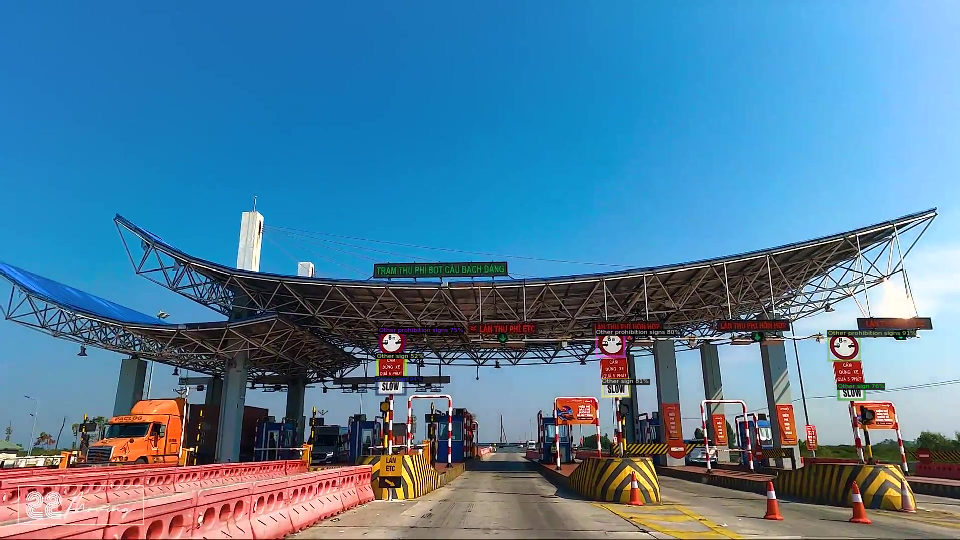

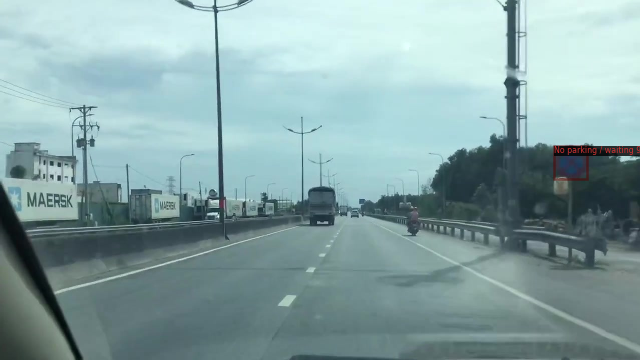

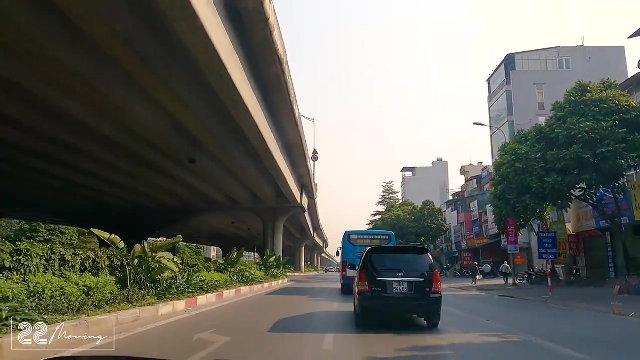

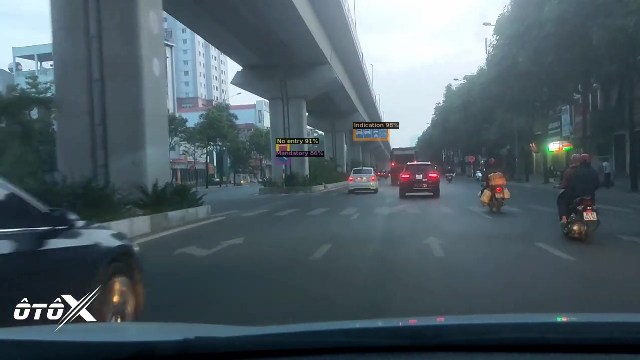

In [ ]:
# Predict 10 ảnh từ tập val
for d in random.sample(val_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  
    v = Visualizer(im[:, :, ::-1],
                   metadata=traffic_sign_metadata,
                   scale=0.5,
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

#**VIII. Predict Video**

In [ ]:
%cd /content/drive/MyDrive/CS114/Dung/Train6_newdata

/content/drive/.shortcut-targets-by-id/1ar57-yjgthRYEyLux_DeH_CoOeuRRcmb/CS114/Dung/Train6_newdata


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path model
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5   # Đặt lại threshold
cfg.DATASETS.TEST = ("signs_data/val", )
predictor = DefaultPredictor(cfg)

In [ ]:
import tqdm
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
import time

In [ ]:
# Setup các thuộc tính video
video = cv2.VideoCapture('/content/drive/MyDrive/CS114/Dien/video/video_test.mp4')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Khởi tạo video writer
video_writer = cv2.VideoWriter('video_night_train4_0dot5.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

# Khởi tạo visualizer
v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)

def runOnVideo(video, maxFrames):
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """

    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Lấy kết quả predict mỗi frame
        outputs = predictor(frame)

        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Vẽ bouding box lên mỗi frame
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

        # Chuyển Matplotlib RGB format thành OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

# Số frame muốn chuyển
num_frames = 8000


for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

    # Test ảnh
    cv2.imwrite('POSE detectron2.png', visualization)

    # Tạo thành video
    video_writer.write(visualization)

video.release()
video_writer.release()
cv2.destroyAllWindows()

8001it [46:56,  2.84it/s]
